In [1]:
import pandas as pd
import numpy as np
import pickle5 as pickle
from create_success_metric import create_success_metric, check_score_rank
from evaluate_supervised import evaluate_model
from split_data import split_data
from model_supervised import run_model
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier


## Load Data
Note: data on my end is from old pickle, comment out the drop line if using updated pickle

In [2]:
with open('data/combined_Appliances.pkl', 'rb') as f:
    # The protocol version used is detected automatically, so we do not
    # have to specify it.
    combined_df = pickle.load(f)
combined_df.drop(columns=['tot_stars','tot_reviews','avg_stars'],inplace=True)

with open('data/review_Appliances.pkl', 'rb') as f:
    # The protocol version used is detected automatically, so we do not
    # have to specify it.
    review_df = pickle.load(f)
# combined_df = pd.read_pickle('data/combined_Appliances.pkl')

## Add Score and Class Labels
This step should be part of the data cleaning/processing 

/Users/stuartong/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/stuartong/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


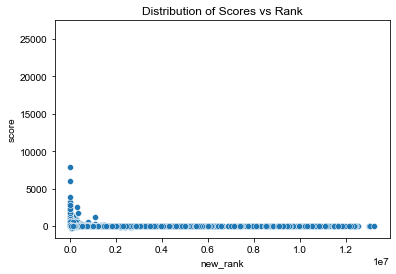

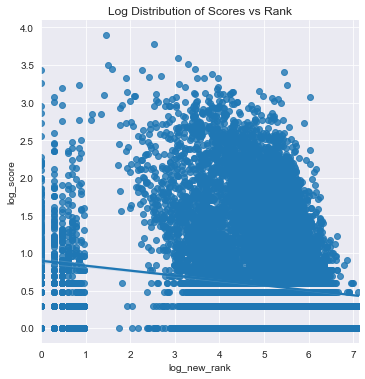

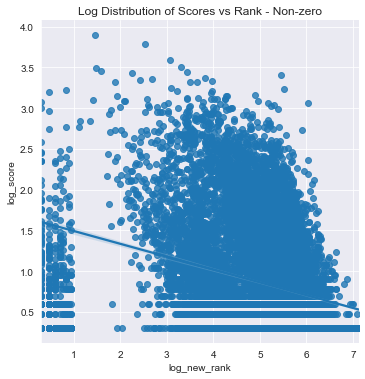

In [3]:
combined_f_df = create_success_metric(review_df,combined_df,20)

## Run Logistic Regression for baseline

In [4]:
params={
    'random_state':42,
    'max_iter':5000,
    'solver':'saga',
    'class_weight' : 'balanced'
}

clf,X_train,X_test,X_val,y_train,y_test,y_val=run_model(combined_f_df,LogisticRegression,params,False,False)

Dropping 956 rows with empty vectors
Scaling features...
No oversampling done
Current Class Balance: Counter({0: 15131, 1: 2438})


Accuracy Scores - Check for Overfit & Compare to Dummy

Training Accuracy: 0.6003756616768171
Test Accuracy: 0.6032098343862046
Dummy Most Frequent Accuracy: 0.8695577940925389
Dummy Uniform Accuracy: 0.5007683114222298


F1 Scores - weighted


Test F1: 0.6675831631404349
Dummy Most Frequent F1: 0.8088872776827946
Dummy Uniform F1: 0.579854313266375

Classification Report - Test Set
              precision    recall  f1-score   support

           0       0.89      0.62      0.73      5093
           1       0.17      0.50      0.25       764

    accuracy                           0.60      5857
   macro avg       0.53      0.56      0.49      5857
weighted avg       0.80      0.60      0.67      5857



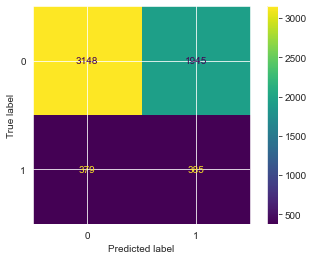

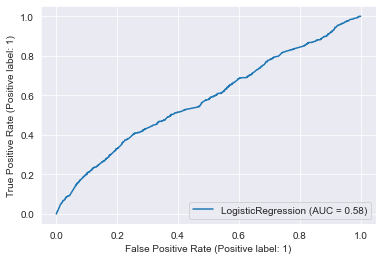

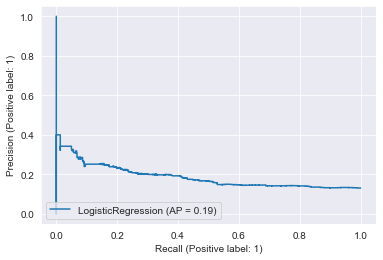

In [5]:
evaluate_model(clf,X_train,X_test,X_val,y_train,y_test,y_val)

Note - dummy classifier predicting most frequent has 80% accuracy 

## Run SVM

In [6]:
# higher gamma, c has less effect
# large gamma = more complex --> more likely to overfit
# normalisation recommended
# for kernel polynomial need degree
# good to do gridsearch to hypertune parameters C and gamma
# doesn't scale well with large data - takes longer with dataset >50k
# https://towardsdatascience.com/support-vector-machine-simply-explained-fee28eba5496

# max iteration of 30000 takes 180 secs for data set of 30k
# any lower has trouble converging

params={
    'random_state':42,
    'max_iter':30000,
    'kernel':'rbf',
    'C': 4,
    'gamma':1,
    'verbose':2,
    'class_weight' : 'balanced'
}

clf,X_train,X_test,X_val,y_train,y_test,y_val=run_model(combined_f_df,SVC,params,True,False)

Dropping 956 rows with empty vectors
Scaling features...
No oversampling done
Current Class Balance: Counter({0: 15131, 1: 2438})
[LibSVM]

Accuracy Scores - Check for Overfit & Compare to Dummy

Training Accuracy: 0.7508680061471911
Test Accuracy: 0.688065562574697
Dummy Most Frequent Accuracy: 0.8695577940925389
Dummy Uniform Accuracy: 0.5007683114222298


F1 Scores - weighted


Test F1: 0.7334085475116333
Dummy Most Frequent F1: 0.8088872776827946
Dummy Uniform F1: 0.579854313266375

Classification Report - Test Set
              precision    recall  f1-score   support

           0       0.90      0.72      0.80      5093
           1       0.20      0.48      0.29       764

    accuracy                           0.69      5857
   macro avg       0.55      0.60      0.54      5857
weighted avg       0.81      0.69      0.73      5857



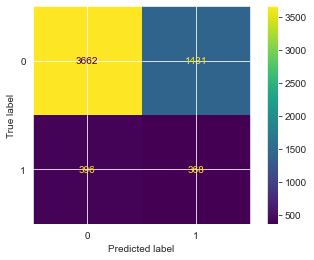

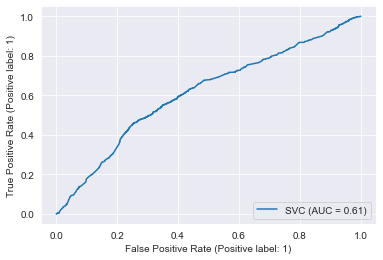

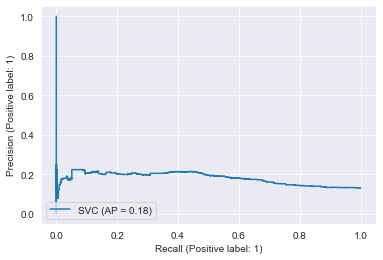

In [7]:
evaluate_model(clf,X_train,X_test,X_val,y_train,y_test,y_val)

A little better than Logistic Regression but still below a dummy classifier

## Run GradientBoostingClassifier

In [8]:
# deals better with imbalance classes - no need class weight/oversample/undersample
# grid serach to tune n_estimators , learning_rate, max_depth



params={
    'random_state':42,
    'learning_rate': 0.01,
    'max_depth':8,
    'n_estimators':500
}

clf,X_train,X_test,X_val,y_train,y_test,y_val=run_model(combined_f_df,GradientBoostingClassifier,params,True,False)

Dropping 956 rows with empty vectors
Scaling features...
No oversampling done
Current Class Balance: Counter({0: 15131, 1: 2438})


Accuracy Scores - Check for Overfit & Compare to Dummy

Training Accuracy: 0.8829756958278786
Test Accuracy: 0.8668260201468329
Dummy Most Frequent Accuracy: 0.8695577940925389
Dummy Uniform Accuracy: 0.5007683114222298


F1 Scores - weighted


Test F1: 0.8139517842376395
Dummy Most Frequent F1: 0.8088872776827946
Dummy Uniform F1: 0.579854313266375

Classification Report - Test Set
              precision    recall  f1-score   support

           0       0.87      0.99      0.93      5093
           1       0.36      0.03      0.05       764

    accuracy                           0.87      5857
   macro avg       0.62      0.51      0.49      5857
weighted avg       0.81      0.87      0.81      5857



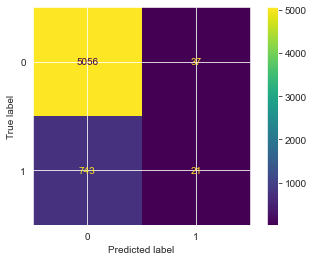

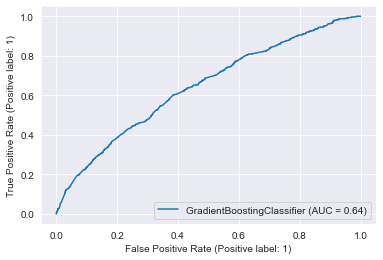

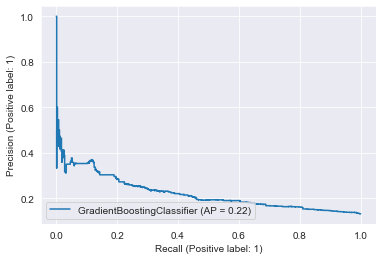

In [9]:
evaluate_model(clf,X_train,X_test,X_val,y_train,y_test,y_val)

Looks better than a dummy by ~1% but only predicting 58 class 1 when test set has 764

Micro average - global metric for total true positives, false negative and false positives is better than dummy too 

Gridsearch to optimise and adding more features might see good results here

## Lastly let's try MLP

In [12]:
params={
    'random_state':42,
    'hidden_layer_sizes':(2,600),
    'alpha':0.5,
    'solver':'adam',
    'learning_rate':'adaptive',
    'learning_rate_init':0.01,
    'max_iter':500
}

clf,X_train,X_test,X_val,y_train,y_test,y_val=run_model(combined_f_df,MLPClassifier,params,False,True)

Dropping 956 rows with empty vectors
Oversampling Data
Origianl dataset shape: Counter({0: 15131, 1: 2438})
Resampple dataset shape: Counter({1: 15131, 0: 15131})


Accuracy Scores - Check for Overfit & Compare to Dummy

Training Accuracy: 0.560967550062785
Test Accuracy: 0.7952876899436572
Dummy Most Frequent Accuracy: 0.8695577940925389
Dummy Uniform Accuracy: 0.5007683114222298


F1 Scores - weighted


Test F1: 0.7951164708255475
Dummy Most Frequent F1: 0.8088872776827946
Dummy Uniform F1: 0.579854313266375

Classification Report - Test Set
              precision    recall  f1-score   support

           0       0.88      0.88      0.88      5093
           1       0.21      0.21      0.21       764

    accuracy                           0.80      5857
   macro avg       0.55      0.55      0.55      5857
weighted avg       0.79      0.80      0.80      5857



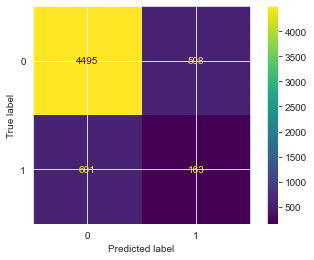

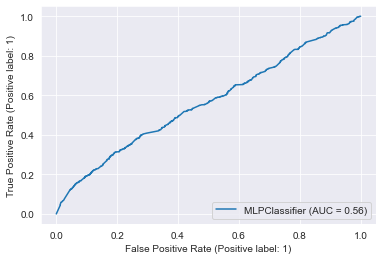

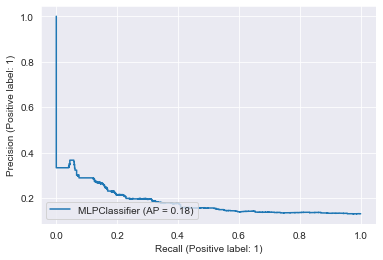

In [13]:
evaluate_model(clf,X_train,X_test,X_val,y_train,y_test,y_val)

Looks promising - with hyperparameter tunning we might be able to get better accuracy for a MLPClassifier but requires careful fine-tunning of hyperparameters

Note more layers = worse performance for weighted f1 scores

In [ ]:
f1_score(y_test,y_pred,average='micro')

## Run GridSearchCV for MLP

In [4]:
params={
    'random_state':42,
    'hidden_layer_sizes':(2,600),
    'alpha':0.5,
    'solver':'adam',
    'learning_rate':'adaptive',
    'learning_rate_init':0.01,
    'max_iter':500
}

# for grid search
params_dict={
    'alpha':[0.5,0.75],
    'learning_rate_init':[0.005,0.0075],
    'random_state':[42],
    'solver':['adam'],
    'learning_rate':['adaptive'],
    'max_iter':[500]
}

clf,X_train,X_test,X_val,y_train,y_test,y_val=run_model(combined_f_df,MLPClassifier,params,False,True,True,params_dict,1,False)

Dropping 956 rows with empty vectors
Oversampling Data
Origianl dataset shape: Counter({0: 15131, 1: 2438})
Resampple dataset shape: Counter({1: 15131, 0: 15131})
Running GridSearch and fitting model with the best params
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5] END alpha=0.5, learning_rate=adaptive, learning_rate_init=0.005, max_iter=500, random_state=42, solver=adam; total time=  45.9s
[CV 2/5] END alpha=0.5, learning_rate=adaptive, learning_rate_init=0.005, max_iter=500, random_state=42, solver=adam; total time= 1.7min
[CV 3/5] END alpha=0.5, learning_rate=adaptive, learning_rate_init=0.005, max_iter=500, random_state=42, solver=adam; total time= 1.1min
[CV 4/5] END alpha=0.5, learning_rate=adaptive, learning_rate_init=0.005, max_iter=500, random_state=42, solver=adam; total time=  50.8s
[CV 5/5] END alpha=0.5, learning_rate=adaptive, learning_rate_init=0.005, max_iter=500, random_state=42, solver=adam; total time=  31.6s
[CV 1/5] END alpha=0.5, learning_r

Accuracy Scores - Check for Overfit & Compare to Dummy

Training Accuracy: 0.6919899543982553
Test Accuracy: 0.8210688065562575
Dummy Most Frequent Accuracy: 0.8695577940925389
Dummy Uniform Accuracy: 0.5007683114222298


F1 Scores - weighted


Test F1: 0.8094557798988112
Dummy Most Frequent F1: 0.8088872776827946
Dummy Uniform F1: 0.579854313266375

Classification Report - Test Set
              precision    recall  f1-score   support

           0       0.88      0.92      0.90      5093
           1       0.25      0.18      0.21       764

    accuracy                           0.82      5857
   macro avg       0.57      0.55      0.56      5857
weighted avg       0.80      0.82      0.81      5857



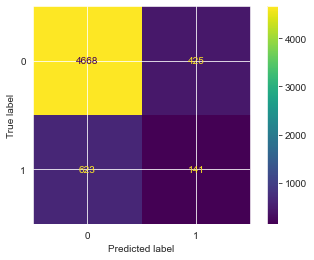

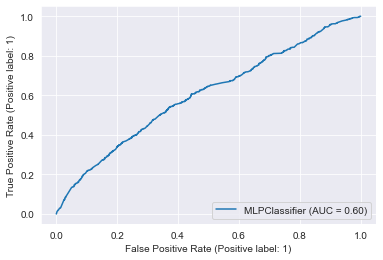

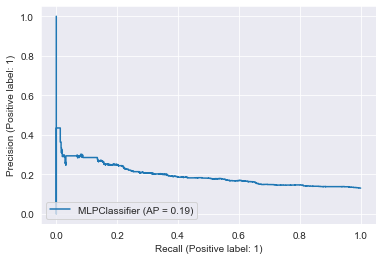

In [5]:
evaluate_model(clf,X_train,X_test,X_val,y_train,y_test,y_val)